In [1]:
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import time
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

In [2]:
current_dir = os.getcwd()
dataset_dir = os.path.join(current_dir, "waldo", "waldo")
waldo_path = os.path.join(dataset_dir, "template.png")
full_pic_path = os.path.join(dataset_dir, "waldo.png")

In [3]:
def load_images(waldo_path, full_pic_path, read_gray=False):
    if read_gray:
        # Read in grayscale
        template_gray = cv2.imread(waldo_path, cv2.IMREAD_GRAYSCALE)
        if template_gray is None:
            raise FileNotFoundError(f"Template image not found at: {waldo_path}")

        main_gray = cv2.imread(full_pic_path, cv2.IMREAD_GRAYSCALE)
        if main_gray is None:
            raise FileNotFoundError(f"Main image not found at: {full_pic_path}")
        return template_gray, main_gray
    else:
        # Read in BGR, then convert to RGB
        template_bgr = cv2.imread(waldo_path)
        if template_bgr is None:
            raise FileNotFoundError(f"Template image not found at: {waldo_path}")

        main_bgr = cv2.imread(full_pic_path)
        if main_bgr is None:
            raise FileNotFoundError(f"Main image not found at: {full_pic_path}")

        template_rgb = cv2.cvtColor(template_bgr, cv2.COLOR_BGR2RGB)
        main_rgb = cv2.cvtColor(main_bgr, cv2.COLOR_BGR2RGB)
        return template_rgb, main_rgb

In [4]:
ROTATE_ANGLES = [0, 45, 90, 135, 180, 225, 270, 315]
SCALE_FACTOR = [0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5]

def rotate_image(image, angle, bg_color=(255, 255, 255)):
    """
    Rotate an image and auto-crop the resulting image to remove padded background.

    Args:
        image: Input image (grayscale or color)
        angle: Angle in degrees
        bg_color: Background color to fill (BGR or grayscale value)

    Returns:
        Cropped rotated image
    """
    if angle == 0:
        return image

    h, w = image.shape[:2]
    center = (w / 2, h / 2)

    rot_mat = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Get the new bounding dimensions
    abs_cos = abs(rot_mat[0, 0])
    abs_sin = abs(rot_mat[0, 1])
    bound_w = int(h * abs_sin + w * abs_cos)
    bound_h = int(h * abs_cos + w * abs_sin)

    # Adjust rotation matrix for translation
    rot_mat[0, 2] += bound_w / 2 - center[0]
    rot_mat[1, 2] += bound_h / 2 - center[1]

    # Perform rotation with padding
    rotated = cv2.warpAffine(
        image,
        rot_mat,
        (bound_w, bound_h),
        borderValue=bg_color
    )

    if len(rotated.shape) == 3:
        mask = cv2.cvtColor(rotated, cv2.COLOR_BGR2GRAY)
    else:
        mask = rotated.copy()

    # Threshold to mask background
    _, thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
    coords = cv2.findNonZero(thresh)
    x, y, w, h = cv2.boundingRect(coords)

    cropped = rotated[y:y+h, x:x+w]
    return cropped


def scale_image(image, scale_factor):
    """
    Scale image by given factor

    Args:
        image: Input image
        scale_factor: Scale factor

    Returns:
        np.ndarray: Scaled image
    """
    if scale_factor == 1.0:
        return image

    if len(image.shape) == 2:  # Grayscale
        h, w = image.shape
    else:  # Color
        h, w = image.shape[:2]

    new_w = int(w * scale_factor)
    new_h = int(h * scale_factor)

    scaled = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_CUBIC)
    return scaled

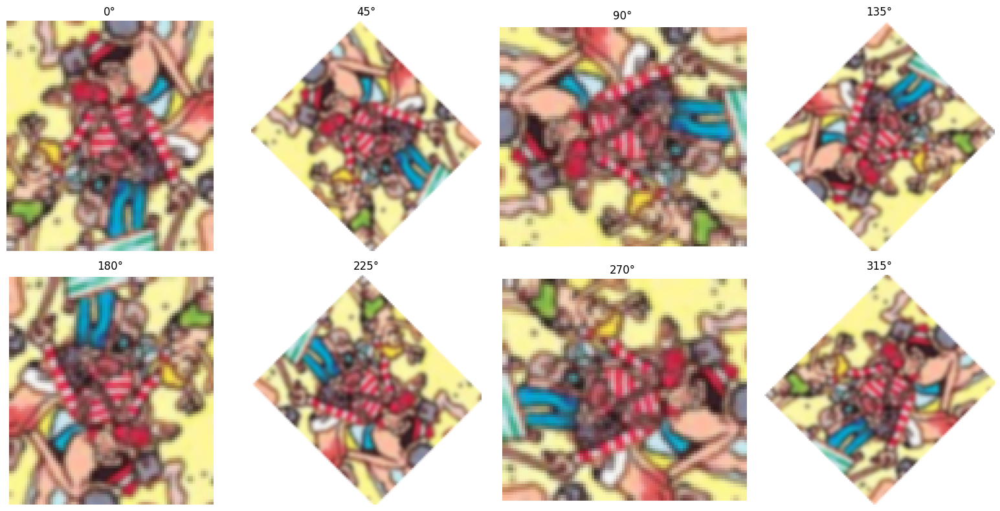

In [ ]:
def visualize_rotated_templates(template, angles):
    """
    Rotate a template at given angles and plot them for inspection.

    Args:
        template (ndarray): The template image.
        angles (list of int): Rotation angles in degrees.
    """
    n = len(angles)
    cols = 4
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(4 * cols, 4 * rows))

    for i, angle in enumerate(angles):
        rotated = rotate_image(template, angle)
        plt.subplot(rows, cols, i + 1)
        if len(rotated.shape) == 2:  # Grayscale
            plt.imshow(rotated, cmap='gray')
        else:  # Color
            plt.imshow(rotated)
        plt.title(f"{angle}°")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_rotated_templates(processed_template, ROTATE_ANGLES)


In [5]:
def preprocess_images(template_img, main_img, kernel_size=(7, 7)):
    template_processed = cv2.GaussianBlur(template_img, kernel_size, 1.0)
    main_processed = cv2.GaussianBlur(main_img, kernel_size, 1.0)

    return template_processed, main_processed

In [ ]:
def template_match(main_image, template, method=cv2.TM_CCOEFF_NORMED):
    """
    Perform single template matching

    Args:
        main_image: Main image to search in
        template: Template to find
        method: OpenCV template matching method

    Returns:
        dict: Match results
    """
    result = cv2.matchTemplate(main_image, template, method)

    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

    if method in [cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR_NORMED]:
        correlation_value = max_val
        location = max_loc
    else:
        correlation_value = 1 - min_val  # Convert to similarity measure
        location = min_loc

    return {
        'correlation': correlation_value,
        'location': location,
        'result_matrix': result
    }

def cross_correlation_matching_multi_transform(template_processed, main_processed,
                                               method=cv2.TM_CCOEFF_NORMED,
                                               threshold=0.8,
                                               min_distance=20):
    """
    Perform cross-correlation template matching with rotation and scale variations
    and return all match locations above a threshold, filtered to remove near-duplicates.

    Args:
        template_processed: Processed template image
        main_processed: Processed main image
        rotation_angles: List of angles to try
        scale_factors: List of scale factors to try
        method: OpenCV template matching method
        threshold: Correlation threshold for detecting matches
        min_distance: Minimum distance to separate two distinct detections

    Returns:
        list of dicts: Each dict contains info about a found Waldo
    """
    rotation_angles = ROTATE_ANGLES
    scale_factors = SCALE_FACTOR

    all_matches = []
    total_combinations = len(rotation_angles) * len(scale_factors)
    current_combination = 0

    print(f"Testing {len(rotation_angles)} rotation angles and {len(scale_factors)} scale factors...")
    print(f"Total combinations to test: {total_combinations}")

    start_time = time.time()

    for angle in rotation_angles:
        for scale in scale_factors:
            current_combination += 1
            print(f"Testing combination {current_combination}/{total_combinations}: "
                  f"Angle={angle}°, Scale={scale:.1f}")

            # Transform template
            transformed_template = scale_image(template_processed, scale)
            transformed_template = rotate_image(transformed_template, angle)

            # Skip if template is invalid
            if transformed_template.shape[0] >= main_processed.shape[0] or \
               transformed_template.shape[1] >= main_processed.shape[1] or \
               transformed_template.shape[0] < 5 or transformed_template.shape[1] < 5:
                continue

            # Match
            result_matrix = cv2.matchTemplate(main_processed, transformed_template, method)

            # Find all match locations above threshold
            loc = np.where(result_matrix >= threshold)
            for pt in zip(*loc[::-1]):  # (x, y)
                correlation = result_matrix[pt[1], pt[0]]

                # Check if this point is too close to any already accepted match
                is_duplicate = False
                for existing in all_matches:
                    existing_pt = np.array(existing['location'])
                    if np.linalg.norm(np.array(pt) - existing_pt) < min_distance:
                        is_duplicate = True
                        break

                if not is_duplicate:
                    match_info = {
                        'angle': angle,
                        'scale': scale,
                        'location': pt,
                        'correlation': correlation,
                        'template_size': transformed_template.shape
                    }
                    all_matches.append(match_info)

    end_time = time.time()

    print(f"amount of time took to look for all waldo configs = {end_time - start_time}")

    print(f"\nTotal non-duplicate matches found above threshold ({threshold}): {len(all_matches)}")
    return all_matches

In [ ]:
def draw_all_matches(image, matches, color=(0, 0, 255), thickness=6):
    """
    Draw rectangles for all matches on an image using matplotlib (RGB format).

    Args:
        image: Original image (BGR or RGB).
        matches: List of match dictionaries.
        color: Tuple for rectangle color (R, G, B).
        thickness: Thickness of rectangle.

    Returns:
        Displays the image with matches using matplotlib.
    """
    img_copy = image.copy()

    for match in matches:
        top_left = match['location']
        h, w = match['template_size'][:2]
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(img_copy, top_left, bottom_right, color, thickness)

    plt.figure(figsize=(12, 8))
    plt.imshow(img_copy)
    plt.title(f'Matches found: {len(matches)}')
    plt.axis('off')
    plt.show()


In [ ]:
waldo_path = os.path.join(dataset_dir, "template.png")
full_pic_path = os.path.join(dataset_dir, "waldo.png")
template_rgb, main_image_rgb = load_images(waldo_path, full_pic_path, read_gray=False)
processed_template, processed_main = preprocess_images(template_rgb, main_image_rgb)

results = cross_correlation_matching_multi_transform(processed_template, processed_main, threshold=0.6)


Testing 8 rotation angles and 8 scale factors...
Total combinations to test: 64
Testing combination 1/64: Angle=0°, Scale=0.8
Testing combination 2/64: Angle=0°, Scale=0.9
Testing combination 3/64: Angle=0°, Scale=1.0
Testing combination 4/64: Angle=0°, Scale=1.1
Testing combination 5/64: Angle=0°, Scale=1.2
Testing combination 6/64: Angle=0°, Scale=1.3
Testing combination 7/64: Angle=0°, Scale=1.4
Testing combination 8/64: Angle=0°, Scale=1.5
Testing combination 9/64: Angle=45°, Scale=0.8
Testing combination 10/64: Angle=45°, Scale=0.9
Testing combination 11/64: Angle=45°, Scale=1.0
Testing combination 12/64: Angle=45°, Scale=1.1
Testing combination 13/64: Angle=45°, Scale=1.2
Testing combination 14/64: Angle=45°, Scale=1.3
Testing combination 15/64: Angle=45°, Scale=1.4
Testing combination 16/64: Angle=45°, Scale=1.5
Testing combination 17/64: Angle=90°, Scale=0.8
Testing combination 18/64: Angle=90°, Scale=0.9
Testing combination 19/64: Angle=90°, Scale=1.0
Testing combination 20/64

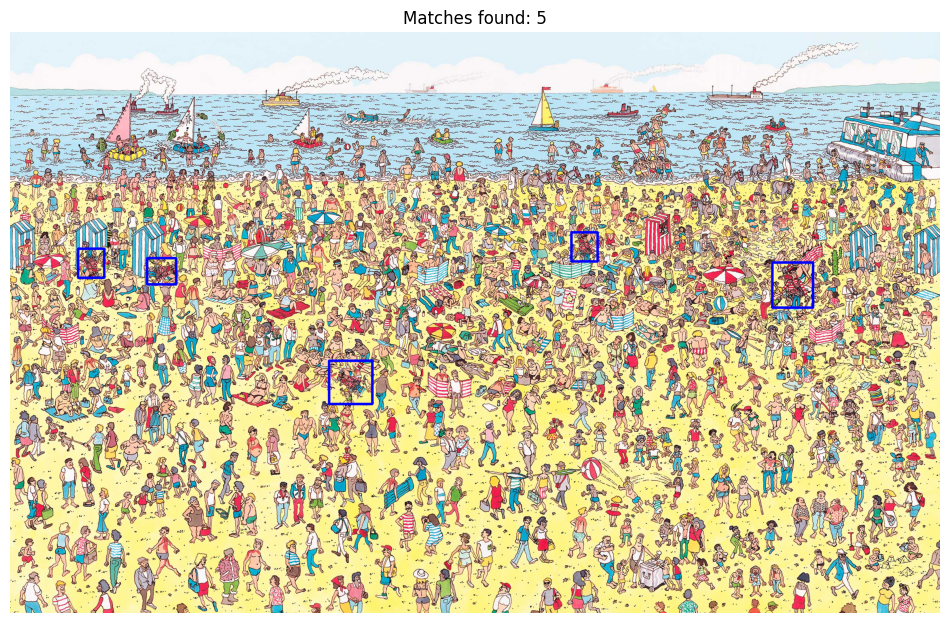

In [ ]:
draw_all_matches(main_image_rgb, results)

In [ ]:
waldo_path = os.path.join(dataset_dir, "template.png")
full_pic_path = os.path.join(dataset_dir, "waldo.png")
template_grey, main_image_grey = load_images(waldo_path, full_pic_path, read_gray=True)
processed_template_grey, processed_main_grey = preprocess_images(template_grey, main_image_grey)

results_grey = cross_correlation_matching_multi_transform(processed_template_grey, processed_main_grey, threshold=0.6)


Testing 8 rotation angles and 8 scale factors...
Total combinations to test: 64
Testing combination 1/64: Angle=0°, Scale=0.8
Testing combination 2/64: Angle=0°, Scale=0.9
Testing combination 3/64: Angle=0°, Scale=1.0
Testing combination 4/64: Angle=0°, Scale=1.1
Testing combination 5/64: Angle=0°, Scale=1.2
Testing combination 6/64: Angle=0°, Scale=1.3
Testing combination 7/64: Angle=0°, Scale=1.4
Testing combination 8/64: Angle=0°, Scale=1.5
Testing combination 9/64: Angle=45°, Scale=0.8
Testing combination 10/64: Angle=45°, Scale=0.9
Testing combination 11/64: Angle=45°, Scale=1.0
Testing combination 12/64: Angle=45°, Scale=1.1
Testing combination 13/64: Angle=45°, Scale=1.2
Testing combination 14/64: Angle=45°, Scale=1.3
Testing combination 15/64: Angle=45°, Scale=1.4
Testing combination 16/64: Angle=45°, Scale=1.5
Testing combination 17/64: Angle=90°, Scale=0.8
Testing combination 18/64: Angle=90°, Scale=0.9
Testing combination 19/64: Angle=90°, Scale=1.0
Testing combination 20/64

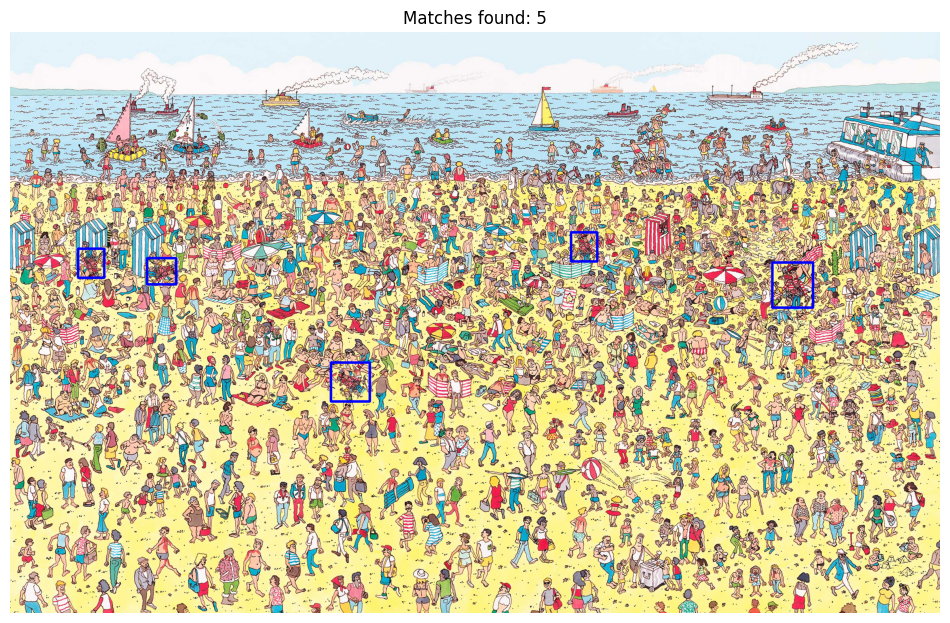

In [ ]:
draw_all_matches(main_image_rgb, results_grey)

In [ ]:
def pyramid_template_matching(template, image,
                              num_levels=3,
                              method=cv2.TM_CCOEFF_NORMED,
                              threshold=0.8,
                              min_distance=20,
                              rotation_angles=None,
                              scale_factors=None):
    """
    Multi-resolution pyramid template matching with scale and rotation.

    Args:
        template (ndarray): Template image
        image (ndarray): Main image
        num_levels (int): Number of pyramid levels
        method (int): Template matching method
        threshold (float): Match threshold
        min_distance (int): Distance for duplicate filtering
        rotation_angles (list): Angles to try
        scale_factors (list): Scales to try

    Returns:
        list of dicts: Match results
    """
    if rotation_angles is None:
        rotation_angles = ROTATE_ANGLES
    if scale_factors is None:
        scale_factors = SCALE_FACTOR

    # Build image and template pyramids
    image_pyramid = [image]
    template_pyramid = [template]
    for _ in range(1, num_levels):
        image = cv2.pyrDown(image) # halves the image resolution
        template = cv2.pyrDown(template)
        image_pyramid.append(image)
        template_pyramid.append(template)

    matches = []

    start_time = time.time()

    for level in reversed(range(num_levels)):  # from low-res to high-res
        img = image_pyramid[level]
        tmpl = template_pyramid[level]

        level_scale = 2 ** level
        print(f"\n Matching at pyramid level {level} (scale x{level_scale})")

        for angle in rotation_angles:
            for scale in scale_factors:
                # Scale and rotate the template
                transformed_template = scale_image(tmpl, scale)
                transformed_template = rotate_image(transformed_template, angle)

                # Skip bad sizes
                if transformed_template.shape[0] >= img.shape[0] or \
                   transformed_template.shape[1] >= img.shape[1] or \
                   transformed_template.shape[0] < 5 or \
                   transformed_template.shape[1] < 5:
                    continue

                result = cv2.matchTemplate(img, transformed_template, method)
                loc = np.where(result >= threshold)

                for pt in zip(*loc[::-1]):
                    correlation = result[pt[1], pt[0]]
                    match_x = pt[0] * level_scale
                    match_y = pt[1] * level_scale

                    # Check for duplicates
                    is_duplicate = False
                    for existing in matches:
                        dist = np.linalg.norm(np.array([match_x, match_y]) - np.array(existing['location']))
                        if dist < min_distance:
                            is_duplicate = True
                            break

                    if not is_duplicate:
                        matches.append({
                            'angle': angle,
                            'scale': scale,
                            'location': (match_x, match_y),
                            'correlation': correlation,
                            'template_size': (
                                transformed_template.shape[0] * level_scale,
                                transformed_template.shape[1] * level_scale
                            ),
                            'pyramid_level': level
                        })

    end_time = time.time()

    print(f"amount of time took to look for all waldo configs = {end_time - start_time}")

    print(f"\n Total non-duplicate matches across pyramid: {len(matches)}")
    return matches


In [ ]:
waldo_path = os.path.join(dataset_dir, "template.png")
full_pic_path = os.path.join(dataset_dir, "waldo.png")
template_grey, main_image_grey = load_images(waldo_path, full_pic_path, read_gray=True)
processed_template_grey, processed_main_grey = preprocess_images(template_grey, main_image_grey)

matches_pyramid = pyramid_template_matching(
    processed_template_grey,
    processed_main_grey,
    num_levels=6,
    threshold=0.90,
    min_distance=40
)


 Matching at pyramid level 5 (scale x32)

 Matching at pyramid level 4 (scale x16)

 Matching at pyramid level 3 (scale x8)

 Matching at pyramid level 2 (scale x4)

 Matching at pyramid level 1 (scale x2)

 Matching at pyramid level 0 (scale x1)
amount of time took to look for all waldo configs = 6.764735698699951

 Total non-duplicate matches across pyramid: 23


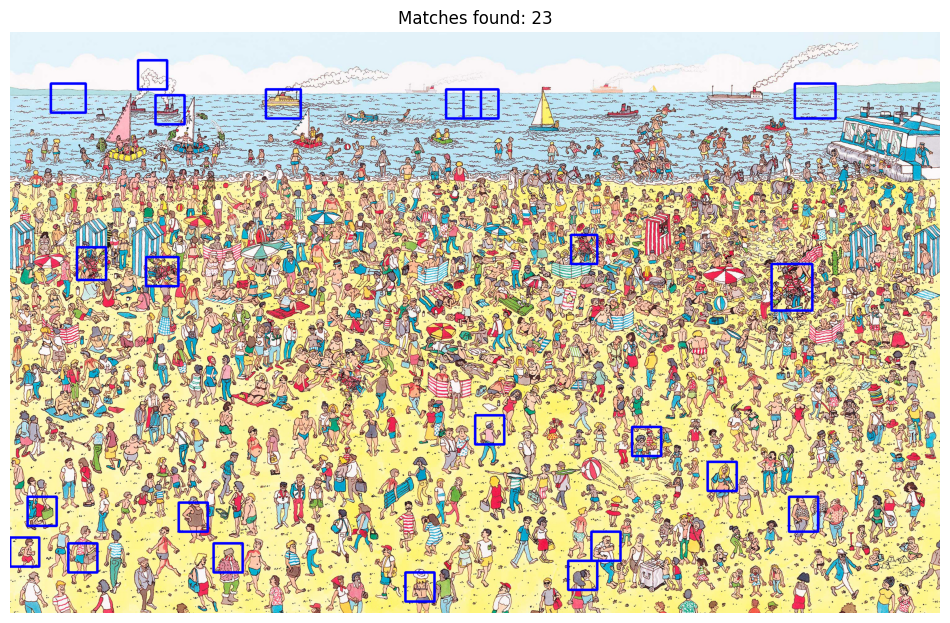

In [ ]:
draw_all_matches(main_image_rgb, matches_pyramid)

In [ ]:
waldo_path = os.path.join(dataset_dir, "template.png")
full_pic_path = os.path.join(dataset_dir, "waldo.png")
template_grey, main_image_grey = load_images(waldo_path, full_pic_path, read_gray=True)
processed_template_grey, processed_main_grey = preprocess_images(template_grey, main_image_grey)

matches_pyramid = pyramid_template_matching(
    processed_template_grey,
    processed_main_grey,
    num_levels=3,
    threshold=0.70,
    min_distance=40
)


 Matching at pyramid level 2 (scale x4)

 Matching at pyramid level 1 (scale x2)

 Matching at pyramid level 0 (scale x1)
amount of time took to look for all waldo configs = 6.921553373336792

 Total non-duplicate matches across pyramid: 5


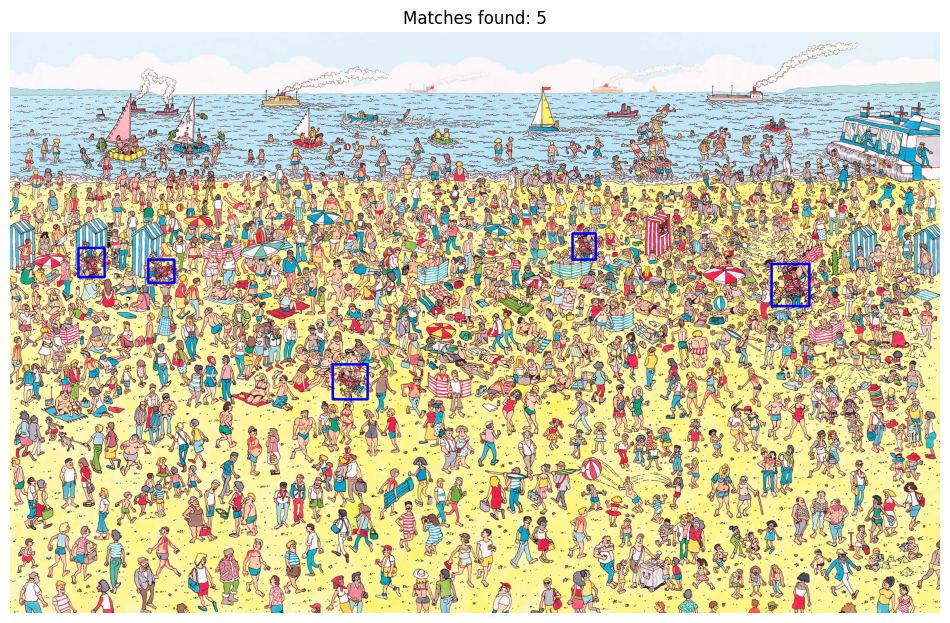

In [ ]:
draw_all_matches(main_image_rgb, matches_pyramid)

In [ ]:
waldo_path = os.path.join(dataset_dir, "template.png")
full_pic_path = os.path.join(dataset_dir, "waldo.png")
template_rgb, main_image_rgb = load_images(waldo_path, full_pic_path, read_gray=False)
processed_template_rgb, processed_main_rgb = preprocess_images(template_rgb, main_image_rgb)

matches_pyramid_new_rgb = pyramid_template_matching(
    processed_template_rgb,
    processed_main_rgb,
    num_levels=3,
    threshold=0.65,
    min_distance=40
)


 Matching at pyramid level 2 (scale x4)

 Matching at pyramid level 1 (scale x2)

 Matching at pyramid level 0 (scale x1)
amount of time took to look for all waldo configs = 19.604371070861816

 Total non-duplicate matches across pyramid: 5


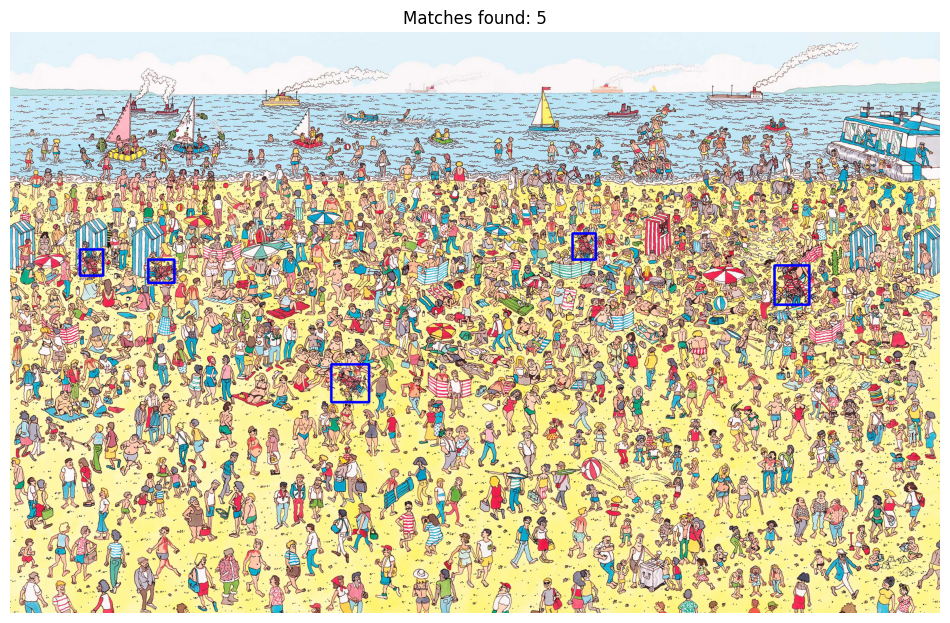

In [ ]:
draw_all_matches(main_image_rgb, matches_pyramid_new_rgb)

## DL methods

In [5]:
import cv2
import numpy as np
import os
import random
from typing import List, Tuple

PATCH_SIZE = (200, 200)
ROTATE_ANGLES = [0, 45, 90, 135, 180, 225, 270, 315]
SCALE_FACTOR = [0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5]

def weighted_random_angle():
    weights = [5 if a == 0 else 1 for a in ROTATE_ANGLES]
    return random.choices(ROTATE_ANGLES, weights=weights, k=1)[0]

def load_image(path: str) -> np.ndarray:
    return cv2.imread(path)

# Generate a single patch (200x200) with or without a Waldo
def generate_training_patch(background: np.ndarray, waldo: np.ndarray, insert_waldo=True) -> Tuple[np.ndarray, int, Tuple[int, int]]:
    h, w = background.shape[:2]
    ph, pw = PATCH_SIZE

    # Random location for the patch (make sure it fits)
    y = random.randint(0, h - ph)
    x = random.randint(0, w - pw)
    patch = background[y:y+ph, x:x+pw].copy()

    if insert_waldo:
        # Random transform for Waldo
        scale = random.choice(SCALE_FACTOR)
        angle = weighted_random_angle()
        transformed_waldo = scale_image(waldo, scale)
        transformed_waldo = rotate_image(transformed_waldo, angle)

        wh, ww = transformed_waldo.shape[:2]

        # Skip if waldo is too big
        if wh >= ph or ww >= pw:
            return patch, 0, (0, 0)

        # Random position inside patch for Waldo
        wy = random.randint(0, ph - wh)
        wx = random.randint(0, pw - ww)

        # Transparent pasting (if alpha channel exists)
        if transformed_waldo.shape[2] == 4:
            alpha = transformed_waldo[:, :, 3] / 255.0
            for c in range(3):
                patch[wy:wy+wh, wx:wx+ww, c] = (
                    alpha * transformed_waldo[:, :, c] +
                    (1 - alpha) * patch[wy:wy+wh, wx:wx+ww, c]
                )
        else:  # Normal overlay
            patch[wy:wy+wh, wx:wx+ww] = transformed_waldo

        return patch, 1, (wx, wy)

    return patch, 0, (0, 0)

# Generate dataset from a background + waldo image
def generate_training_dataset(background: np.ndarray, waldo: np.ndarray, count=1000, waldo_prob=0.5) -> Tuple[List[np.ndarray], List[int], List[Tuple[int, int]]]:
    images = []
    labels = []
    locations = []

    for _ in range(count):
        insert = random.random() < waldo_prob
        patch, label, location = generate_training_patch(background, waldo, insert_waldo=insert)
        images.append(patch)
        labels.append(label)
        locations.append(location)

    return images, labels, locations


In [6]:
import matplotlib.pyplot as plt

def visualize_training_patches(images, labels, locations, count=12):
    """
    Plot a few training patches with bounding boxes if Waldo is present.

    Args:
        images (list of np.ndarray): List of 200x200 patches.
        labels (list of int): 1 if Waldo is present, 0 otherwise.
        locations (list of (x, y)): Top-left corner of Waldo in the patch.
        count (int): Number of samples to plot.
    """
    cols = 4
    rows = (count + cols - 1) // cols
    plt.figure(figsize=(4 * cols, 4 * rows))

    images=images[:210]
    for i in range(min(count, len(images))):
        img = images[i].copy()
        label = labels[i]
        loc = locations[i]

        if label == 1:
            # Draw Waldo bounding box (just assume fixed size e.g., 40x40 for visualization)
            x, y = loc
            cv2.rectangle(img, (x, y), (x+40, y+40), (255, 0, 0), 2)

        plt.subplot(rows, cols, i+1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f'Waldo: {"Yes" if label else "No"}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
# waldo_image = cv2.imread(os.path.join(dataset_dir, "template.png"), cv2.IMREAD_UNCHANGED)
# background_image = cv2.imread(os.path.join(dataset_dir, "waldo.png"))
try:
  waldo_image = cv2.imread("template.png", cv2.IMREAD_UNCHANGED)
  background_image = cv2.imread("waldo.png")
except:
  print("not found")

images, labels, locations = generate_training_dataset(background_image, waldo_image, count=10000)

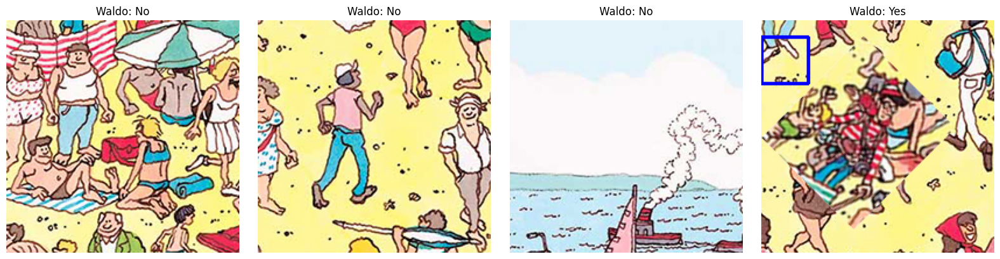

In [ ]:
visualize_training_patches(images, labels, locations, count=4)

In [7]:
import torch
import torch.nn as nn
import torchvision.models as models

class WaldoDetector(nn.Module):
    def __init__(self, pretrained=True):
        super(WaldoDetector, self).__init__()

        # Base model: pretrained MobileNetV2 (lightweight and effective)
        base_model = models.mobilenet_v2(pretrained=pretrained)
        self.backbone = base_model.features  # remove classifier head

        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))  # output shape: [B, C, 1, 1]

        in_features = base_model.last_channel  # usually 1280

        # Classification head: is Waldo present?
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

        # Regression head: x, y coordinates of Waldo
        self.regressor = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, 2)  # output (x, y)
        )

    def forward(self, x):
        features = self.backbone(x)               # shape: [B, C, H, W]
        pooled = self.global_pool(features)       # shape: [B, C, 1, 1]

        cls = self.classifier(pooled)             # shape: [B, 1]
        loc = self.regressor(pooled)              # shape: [B, 2]

        return cls.squeeze(1), loc


In [8]:
class WaldoDataset(Dataset):
    def __init__(self, images, labels, locations, transform=None):
        self.images = images
        self.labels = labels
        self.locations = locations
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        label = self.labels[idx]
        location = self.locations[idx]

        if self.transform:
            img = self.transform(img)
        else:
            img = custom_transform(img)

        return img, torch.tensor(label, dtype=torch.float32), torch.tensor(location, dtype=torch.float32)

def custom_transform(img):
    img_resized = cv2.resize(img, (200, 200))
    img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float() / 255.0  # [C, H, W]
    return img_tensor

class WaldoLoss(nn.Module):
    def __init__(self, lambda_reg=1.0):
        super(WaldoLoss, self).__init__()
        self.class_loss = nn.BCELoss()
        self.reg_loss = nn.MSELoss()
        self.lambda_reg = lambda_reg

    def forward(self, cls_pred, loc_pred, cls_target, loc_target):
        loss_cls = self.class_loss(cls_pred, cls_target)
        # Only apply regression loss where Waldo is present (target == 1)
        mask = cls_target > 0.5
        if mask.sum() > 0:
            loss_reg = self.reg_loss(loc_pred[mask], loc_target[mask])
        else:
            loss_reg = torch.tensor(0.0, device=cls_pred.device)
        return loss_cls + self.lambda_reg * loss_reg, loss_cls, loss_reg


def train_model(model, dataloader, optimizer, device, epochs=5, lambda_reg=1.0):
    model.to(device)
    criterion = WaldoLoss(lambda_reg=lambda_reg)
    model.train()

    for epoch in range(epochs):
        total_loss = 0.0
        total_cls_loss = 0.0
        total_reg_loss = 0.0
        total_samples = 0
        correct_cls = 0
        positive_samples = 0

        for batch in dataloader:
            imgs, cls_targets, loc_targets = batch
            imgs = imgs.to(device)
            cls_targets = cls_targets.to(device)
            loc_targets = loc_targets.to(device)

            optimizer.zero_grad()
            cls_preds, loc_preds = model(imgs)
            loss, loss_cls, loss_reg = criterion(cls_preds, loc_preds, cls_targets, loc_targets)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_cls_loss += loss_cls.item()
            total_reg_loss += loss_reg.item()
            total_samples += cls_targets.size(0)
            positive_samples += (cls_targets > 0.5).sum().item()

            # Count classification accuracy
            preds = (cls_preds > 0.5).float()
            correct_cls += (preds == cls_targets).sum().item()

        avg_loss = total_loss / len(dataloader)
        avg_cls_loss = total_cls_loss / len(dataloader)
        avg_reg_loss = total_reg_loss / max(positive_samples, 1)
        accuracy = correct_cls / total_samples * 100

        print(f" Epoch {epoch+1}/{epochs}")
        print(f"    Total Loss      : {avg_loss:.4f}")
        print(f"    Classification  : {avg_cls_loss:.4f}")
        print(f"    Regression      : {avg_reg_loss:.4f} (on {positive_samples} samples)")
        print(f"    Accuracy        : {accuracy:.2f}%")
        print("-" * 50)

    print(" Training complete.")



In [ ]:
dataset = WaldoDataset(images, labels, locations)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

model = WaldoDetector(pretrained=True)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
device='cuda' if torch.cuda.is_available() else 'cpu'
print(device)
train_model(model, dataloader, optimizer, device, epochs=30)


cuda
 Epoch 1/30
    Total Loss      : 687.9025
    Classification  : 0.3355
    Regression      : 85.6035 (on 5020 samples)
    Accuracy        : 88.57%
--------------------------------------------------
 Epoch 2/30
    Total Loss      : 142.1536
    Classification  : 0.2352
    Regression      : 17.6691 (on 5020 samples)
    Accuracy        : 92.38%
--------------------------------------------------
 Epoch 3/30
    Total Loss      : 88.8197
    Classification  : 0.1693
    Regression      : 11.0372 (on 5020 samples)
    Accuracy        : 94.93%
--------------------------------------------------
 Epoch 4/30
    Total Loss      : 73.3280
    Classification  : 0.1122
    Regression      : 9.1155 (on 5020 samples)
    Accuracy        : 97.07%
--------------------------------------------------
 Epoch 5/30
    Total Loss      : 62.3844
    Classification  : 0.0721
    Regression      : 7.7580 (on 5020 samples)
    Accuracy        : 98.34%
--------------------------------------------------


In [15]:
def custom_transform(img):
    img_resized = cv2.resize(img, (200, 200))
    img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float() / 255.0  # [C, H, W]
    return img_tensor

def generate_inference_patches(full_image, patch_size=(200, 200), stride=100):
    patches = []
    positions = []
    h, w = full_image.shape[:2]
    ph, pw = patch_size

    for y in range(0, h - ph + 1, stride):
        for x in range(0, w - pw + 1, stride):
            patch = full_image[y:y+ph, x:x+pw].copy()
            patches.append(patch)
            positions.append((x, y))

    return patches, positions

def infer_waldo_locations(model, full_image, device='cpu', threshold=0.6):
    model.eval()
    model.to(device)
    patches, positions = generate_inference_patches(full_image)
    results = []

    for patch, (x_offset, y_offset) in zip(patches, positions):
        img_tensor = custom_transform(patch).unsqueeze(0).to(device)
        with torch.no_grad():
            cls_pred, loc_pred = model(img_tensor)
            prob = cls_pred.item()

            if prob >= threshold:
                local_x, local_y = loc_pred[0].cpu().numpy()
                global_x = int(x_offset + local_x)
                global_y = int(y_offset + local_y)
                results.append({
                    'location': (global_x, global_y),
                    'template_size': (80, 40),
                    'confidence': prob
                })

    return results

def draw_all_matches(image, matches, color=(0, 0, 255), thickness=6):
    img_copy = image.copy()
    for match in matches:
        top_left = match['location']
        h, w = match['template_size'][:2]
        bottom_right = (top_left[0] + w, top_left[1] + h)
        cv2.rectangle(img_copy, top_left, bottom_right, color, thickness)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
    # plt.imshow(img_copy)
    plt.title(f'Matches found: {len(matches)}')
    plt.axis('off')
    plt.show()

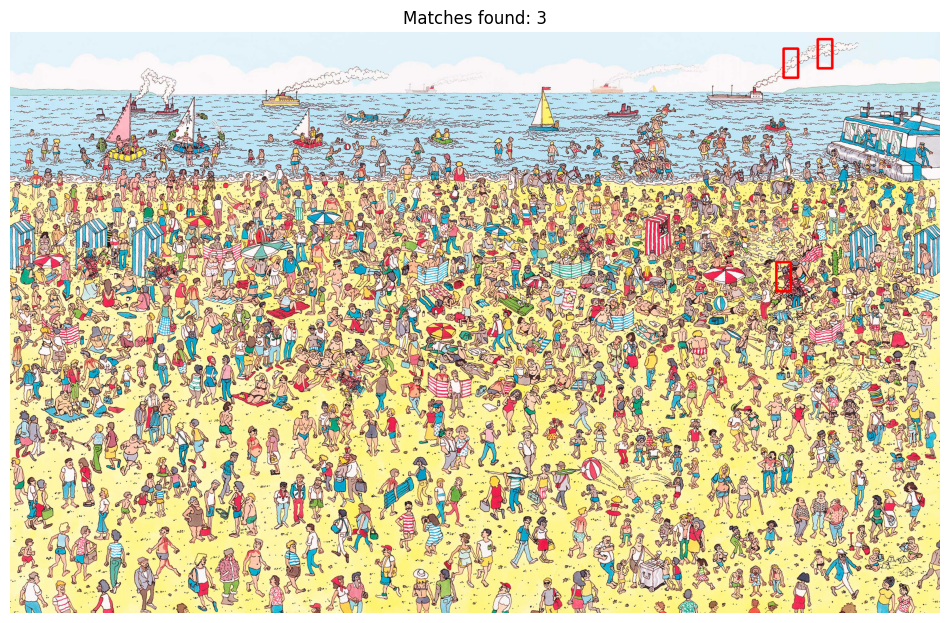

In [ ]:
# Load your full Waldo image (BGR format)
full_image = cv2.imread("waldo.png")

# Run the model on the full image
matches = infer_waldo_locations(model, full_image, device='cuda' if torch.cuda.is_available() else 'cpu')

# Visualize results
draw_all_matches(full_image, matches)


In [10]:
import cv2
import numpy as np
import random
from typing import List, Tuple

# Constants
ROTATE_ANGLES = [0, 45, 90, 135, 180, 225, 270, 315]
SCALE_FACTOR = [0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5]

def weighted_random_angle():
    weights = [5 if a == 0 else 1 for a in ROTATE_ANGLES]
    return random.choices(ROTATE_ANGLES, weights=weights, k=1)[0]

# Assumed to be provided
def scale_image(image: np.ndarray, scale: float) -> np.ndarray:
    h, w = image.shape[:2]
    return cv2.resize(image, (int(w * scale), int(h * scale)), interpolation=cv2.INTER_AREA)

def rotate_image(image: np.ndarray, angle: float) -> np.ndarray:
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    return cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT, borderValue=(0,0,0))

def generate_full_background_sample(background: np.ndarray, waldo: np.ndarray, insert_waldo=True) -> Tuple[np.ndarray, int, Tuple[int, int]]:
    img = background.copy()
    if insert_waldo:
        scale = random.choice(SCALE_FACTOR)
        angle = weighted_random_angle()
        waldo_trans = scale_image(waldo, scale)
        waldo_trans = rotate_image(waldo_trans, angle)

        wh, ww = waldo_trans.shape[:2]
        H, W = img.shape[:2]

        if wh >= H or ww >= W:
            return img, 0, (0, 0)  # skip if Waldo too big

        y = random.randint(0, H - wh)
        x = random.randint(0, W - ww)

        if waldo_trans.shape[2] == 4:  # RGBA
            alpha = waldo_trans[:, :, 3] / 255.0
            for c in range(3):
                img[y:y+wh, x:x+ww, c] = (
                    alpha * waldo_trans[:, :, c] +
                    (1 - alpha) * img[y:y+wh, x:x+ww, c]
                )
        else:
            img[y:y+wh, x:x+ww] = waldo_trans

        return img, 1, (x, y)

    return img, 0, (0, 0)

def generate_full_image_dataset(background: np.ndarray, waldo: np.ndarray, count=1000, waldo_prob=0.5) -> Tuple[List[np.ndarray], List[int], List[Tuple[int, int]]]:
    images = []
    labels = []
    locations = []

    for _ in range(count):
        insert = random.random() < waldo_prob
        img, label, location = generate_full_background_sample(background, waldo, insert)
        images.append(img)
        labels.append(label)
        locations.append(location)

    return images, labels, locations


In [11]:
waldo_image = cv2.imread("template.png", cv2.IMREAD_UNCHANGED)
background_image = cv2.imread("waldo.png")

images_full, labels_full, locations_full = generate_full_image_dataset(background_image, waldo_image, count=500, waldo_prob=0.9)

In [13]:
dataset_full = WaldoDataset(images_full, labels_full, locations_full)
dataloader_full = DataLoader(dataset_full, batch_size=16, shuffle=True)

model_full = WaldoDetector(pretrained=True)
optimizer = torch.optim.Adam(model_full.parameters(), lr=1e-4)
device='cuda' if torch.cuda.is_available() else 'cpu'
print(device)
train_model(model_full, dataloader_full, optimizer, device, epochs=100)


cuda
 Epoch 1/100
    Total Loss      : 1432433.3848
    Classification  : 0.3537
    Regression      : 102316.6443 (on 448 samples)
    Accuracy        : 89.60%
--------------------------------------------------
 Epoch 2/100
    Total Loss      : 1421302.2832
    Classification  : 0.3206
    Regression      : 101521.5686 (on 448 samples)
    Accuracy        : 89.60%
--------------------------------------------------
 Epoch 3/100
    Total Loss      : 1404921.6602
    Classification  : 0.3692
    Regression      : 100351.5208 (on 448 samples)
    Accuracy        : 89.60%
--------------------------------------------------
 Epoch 4/100
    Total Loss      : 1337640.4551
    Classification  : 0.3599
    Regression      : 95545.7208 (on 448 samples)
    Accuracy        : 89.60%
--------------------------------------------------
 Epoch 5/100
    Total Loss      : 1264527.7804
    Classification  : 0.4347
    Regression      : 90323.3819 (on 448 samples)
    Accuracy        : 89.60%
--------

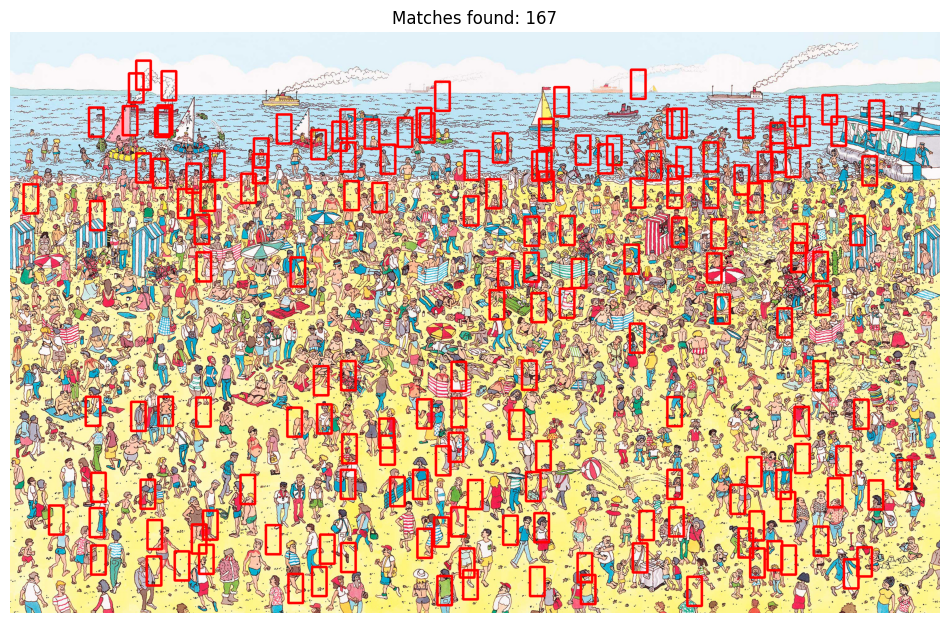

In [16]:
# Load your full Waldo image (BGR format)
full_image = cv2.imread("waldo.png")

# Run the model on the full image
matches = infer_waldo_locations(model_full, full_image, device='cuda' if torch.cuda.is_available() else 'cpu')

# Visualize results
draw_all_matches(full_image, matches)

In [ ]:
# waldo_image = cv2.imread(os.path.join(dataset_dir, "template.png"), cv2.IMREAD_UNCHANGED)
# background_image = cv2.imread(os.path.join(dataset_dir, "waldo.png"))
try:
  waldo_image = cv2.imread("template.png", cv2.IMREAD_UNCHANGED)
  background_image = cv2.imread("waldo.png")
except:
  print("not found")

images_new, labels_new, locations_new = generate_training_dataset(background_image, waldo_image, count=10000, waldo_prob=0.9)

In [ ]:
dataset_new = WaldoDataset(images_new, labels_new, locations_new)
dataloader_new = DataLoader(dataset_new, batch_size=16, shuffle=True)

model_new = WaldoDetector(pretrained=True)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
device='cuda' if torch.cuda.is_available() else 'cpu'
print(device)
train_model(model_new, dataloader_new, optimizer, device, epochs=10)


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


cuda
 Epoch 1/10
    Total Loss      : 3015.3231
    Classification  : 0.7299
    Regression      : 209.2770 (on 9003 samples)
    Accuracy        : 30.00%
--------------------------------------------------
 Epoch 2/10
    Total Loss      : 3011.2067
    Classification  : 0.7318
    Regression      : 208.9911 (on 9003 samples)
    Accuracy        : 28.41%
--------------------------------------------------
 Epoch 3/10
    Total Loss      : 3012.7577
    Classification  : 0.7311
    Regression      : 209.0988 (on 9003 samples)
    Accuracy        : 29.33%
--------------------------------------------------
 Epoch 4/10
    Total Loss      : 3011.6300
    Classification  : 0.7308
    Regression      : 209.0205 (on 9003 samples)
    Accuracy        : 29.30%
--------------------------------------------------
 Epoch 5/10
    Total Loss      : 3015.4686
    Classification  : 0.7303
    Regression      : 209.2871 (on 9003 samples)
    Accuracy        : 29.81%
------------------------------------